<a href="https://colab.research.google.com/github/amit-matreja/Insurance_Claims--Fraud_Detection/blob/main/Insurance_Claims_Fraud_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Insurance Claims- Fraud Detection :**


Problem Statement:

Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
# lets import all required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# lets import dataset using csv file
df=pd.read_csv("https://raw.githubusercontent.com/amit-matreja/Insurance_Claims--Fraud_Detection/main/Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
# lets see top 10 rows of the dataset
df.head(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [4]:
# lets see last 10 rows of the dataset
df.tail(10)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
990,286,43,663190,05-02-1994,IL,100/300,500,1564.43,3000000,477644,FEMALE,MD,prof-specialty,movies,unmarried,77500,-32800,31-01-2015,Single Vehicle Collision,Rear Collision,Minor Damage,Fire,NY,Northbrook,4755 1st St,18,1,?,2,2,YES,34290,3810,3810,26670,Jeep,Grand Cherokee,2013,N,NaN
991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,433981,MALE,MD,other-service,basketball,other-relative,59400,-32200,06-02-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,WV,Riverwood,5312 Francis Ridge,21,1,NO,0,1,NO,46980,0,5220,41760,Accura,TL,2002,N,NaN
992,94,26,215278,24-10-2007,IN,100/300,500,722.66,0,433696,MALE,MD,exec-managerial,camping,husband,50300,0,23-01-2015,Multi-vehicle Collision,Front Collision,Major Damage,Fire,OH,Springfield,1705 Weaver St,6,3,YES,1,2,YES,36700,3670,7340,25690,Nissan,Pathfinder,2010,N,NaN
993,124,28,674570,08-12-2001,OH,250/500,1000,1235.14,0,443567,MALE,MD,exec-managerial,camping,husband,0,-32100,17-02-2015,Multi-vehicle Collision,Side Collision,Total Loss,Other,OH,Hillsdale,1643 Washington Hwy,20,3,?,0,1,?,60200,6020,6020,48160,Volkswagen,Passat,2012,N,NaN
994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,430665,MALE,High School,sales,bungie-jumping,own-child,0,-82100,22-01-2015,Parked Car,?,Minor Damage,None,SC,Northbend,6516 Solo Drive,6,1,?,1,2,YES,6480,540,1080,4860,Honda,Civic,1996,N,NaN
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


# **Exploratory Data Analysis(EDA) and PreProcessing :**

In [5]:
# lets check the shape of the dataset
df.shape

(1000, 40)

* Here we can see that there are 1000 rows present in 40 columns of this dataset.

In [6]:
# lets check the name of the columns present in the dataset
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

* here is the list of all the columns present in the dataset

In [7]:
# Now lets check the information regarding the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

* Here we can observe that there are no null values present in 39 out of 40 columns.
* In Column _c39 there are 0 non-null values, it means that there are no values present in this column so we can drop it.

In [8]:
df.drop("_c39",axis=1, inplace=True)

* Here we have successfully dropped the column which had null values in all the rows.

In [9]:
# lets check the datatype of all the columns present in the dataset
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

* Here we can see that there are three types of datatypes present in this dataset,i.e. integer, float and object dtype.

In [10]:
# lets check the unique values present in all columns of the dataset
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

* Here we can see no. of unique values present in the dataset.
* Here we can observe that there are 2 columns policy no. and incident location which has all the unique values. it can affect in prediction of our model, so we shall drop these 2 columns as well.

In [11]:
df=df.drop(["policy_number","incident_location"],axis=1)

In [12]:
# lets check Presence of null values once more in the dataset
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

Here we can see that there are no null values present in this dataset.

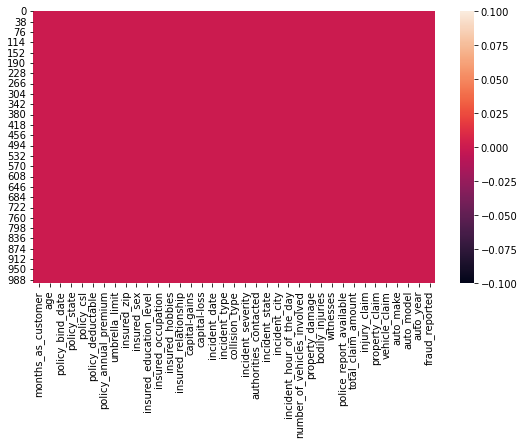

In [13]:
# lets visualize and confirm presence of null values or not?
plt.figure(figsize=(9,5))
sns.heatmap(df.isnull())
plt.show()

* Here we are confirmed that there are no null values present in the dataset.

In [14]:
# Lets check the if there are any empty spaces or observations present in the dataset or not?
df.loc[df['fraud_reported']== " "]

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


* Here we can see that there are no empty space or observations present in the dataset.

In [15]:
# lets check the value counts of each column present in the dataset.
for i in df.columns:
  print(df[i].value_counts())
  print("----------------------------------------------------------")

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
----------------------------------------------------------
43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64
----------------------------------------------------------
05-08-1992    3
28-04-1992    3
01-01-2006    3
07-12-1995    2
28-12-2002    2
             ..
18-11-1994    1
13-07-2013    1
11-02-2010    1
21-04-2010    1
14-11-2014    1
Name: policy_bind_date, Length: 951, dtype: int64
----------------------------------------------------------
OH    35

* Here we can see values with there count of each column present in this dataset.
* Here we can observe that in column umbrella_limit almost 70 to 75% of values are zero, so, 0 values are not going to help in our prediction we can drop this column.
* There are also almost 50% 0 values present in the columns capital-gains and capital-loss.
* And there is value '?' in collission type, property_damage, police_report_available.
* There is a column named insured_zip in this column values seems like some sort of id or code given to the insured person.

In [16]:
# Lets first drop the column with more than 70% 0 values
df=df.drop(["umbrella_limit"],axis=1)

In [17]:
# now lets check the value counts for column insured_zip
df[["insured_zip"]].value_counts()

insured_zip
456602         2
446895         2
469429         2
477695         2
431202         2
              ..
477268         1
477260         1
476978         1
476737         1
430104         1
Length: 995, dtype: int64

* Insured_zip having values like some sort of code. we will not require this for our model building.

In [18]:
# Lets drop column insured_zip column from the dataset
df=df.drop(["insured_zip"],axis=1)

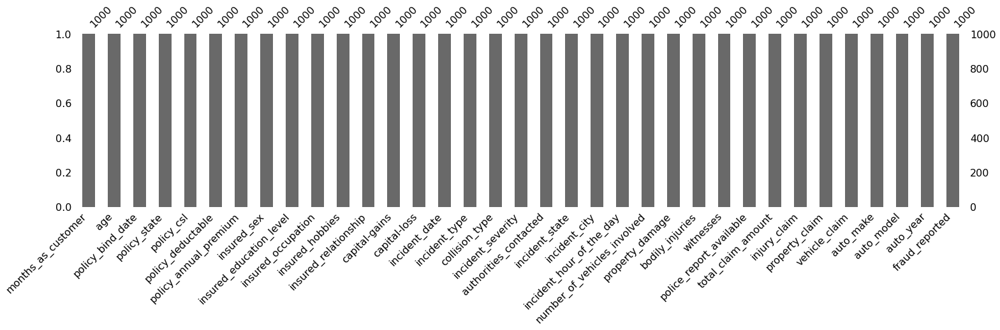

In [19]:
# lets visualize missing no.
# Importing required lib.
import missingno
missingno.bar(df, figsize=(25,5))

* Here we can see that there are no missing values present in any of the columns present in the dataset.

* Here we have successfully distributed columns to object and integer,

In [21]:
# lets see statistical description of all the columns in the dataset
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


* Here we can see difference in mean and median(50% percentile) in columns, months_as_customer, policy_deductable, capital-gains, capital-loss, number_of_vehicles_involved, witnesses, total_claim_amount, injury_claim, property_claim, vehicle_claim which denotes presence of skewness.
* Here we can observe presence of outliers as well as most of the column have big gap in 75%percentile and max.

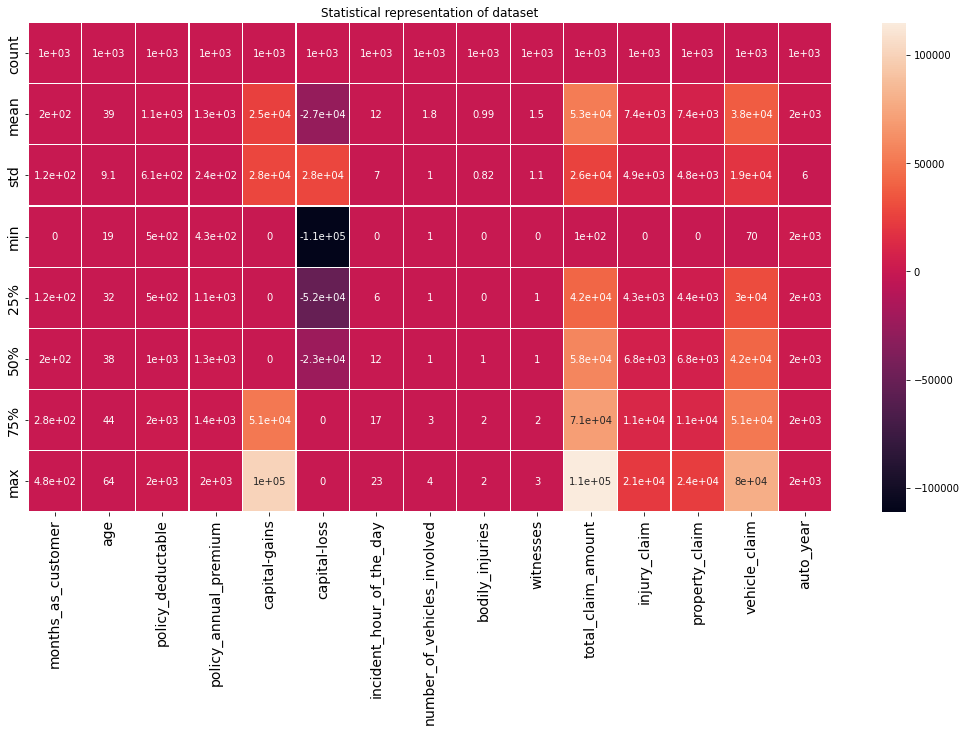

In [23]:
# lets visualize the Statistical Description using heatmap

plt.figure(figsize=(18,9))
sns.heatmap(df.describe(),linewidth=.2, annot=True,fmt=".2g")
plt.title("Statistical representation of dataset")
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [24]:
# Extracting day, month and year from incident_date and Policy_bind_date.
# But first lets change there datatype from object to datetime
df['incident_date']= pd.to_datetime(df['incident_date'])
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])

In [25]:
# lets check data types of columns
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

* We can see we have successfully converted columns data type from object to datetime.

In [26]:
# now lets extract day, month and year from incident_date using lambda function
df["incident_day"]=df["incident_date"].apply(lambda x:x.day)
df['incident_month']=df["incident_date"].apply(lambda x:x.month)
df['incident_year']=df['incident_date'].apply(lambda x:x.year)

In [27]:
# now lets extract day, month and year from policy_bind_date using lambda function
df['policy_bind_day']=df['policy_bind_date'].apply(lambda x:x.day)
df['policy_bind_month']=df['policy_bind_date'].apply(lambda x:x.month)
df['policy_bind_year']=df['policy_bind_date'].apply(lambda x:x.year)

In [28]:
# now lets drop original date columns to avoid repeatition
df.drop(['incident_date','policy_bind_date'], axis=1, inplace=True)

In [29]:
# lets check the value counts again
for i in df.columns:
  print(df[i].value_counts())
  print('--------------------------------------------------------')

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
--------------------------------------------------------
43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64
--------------------------------------------------------
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
--------------------------------------------------------
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
--------------------------------------------------------
1000    351
500     342
2000    307
Name:

* Here we can see that incident_year is having all same values i.e 2015. it will not do anything good in predicting our model, so, lets drop this columns.

In [30]:
# Dropping incident_year column 
df=df.drop(['incident_year'],axis=1)

* here we have successfully dropped the column incident_year.

In [31]:
# while we ran value_counts of all columns we observed that there was question mark'?' present as a value lets replace it with mean of that column
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

In [32]:
# Collision_type is a categorical column and we replace empty value with mode in categorical column
df['collision_type'].mode()

0    Rear Collision
dtype: object

In [33]:
# now lets replace it using mode value
df['collision_type']=df.collision_type.str.replace('?','Rear Collision')

In [34]:
# Property damage is also categorical column( it has values yes,no and ?)
df['property_damage'] = df.property_damage.str.replace('?', 'NO')
# Since 'No' is present most no. of times

In [35]:
#Police_report_available is also categorical (with Replacing '?' with mode value
df['police_report_available'] = df.police_report_available.str.replace('?', 'NO')

# **Visualization :**

# **UniVariate Analysis :**

In [36]:
# Lets divide columns object columns and int. or float column at one variable.
object=[]
integer=[]
for i in df.dtypes.index:
  if df.dtypes[i]=='object':
    object.append(i)
  else:
    integer.append(i)
print(object)
print(integer)

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']
['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'incident_day', 'incident_month', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year']


* Here we have successfully divided data in 2 columns object data into object and integer or float data into the integer.

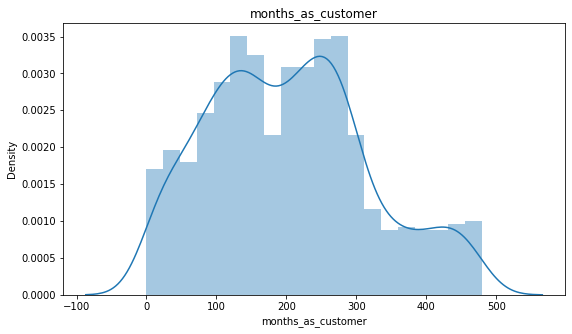

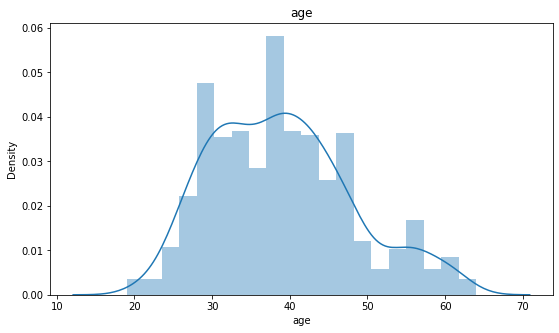

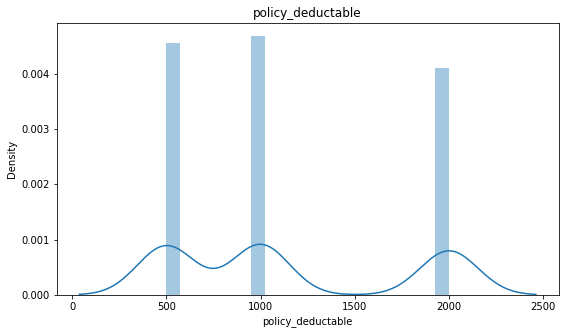

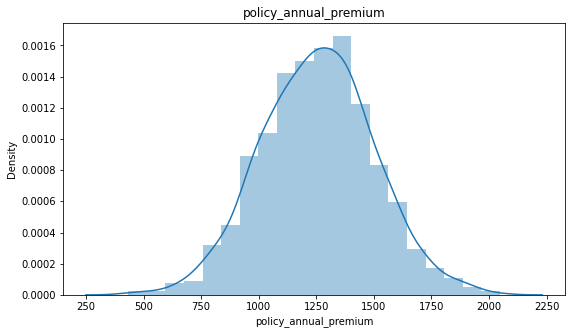

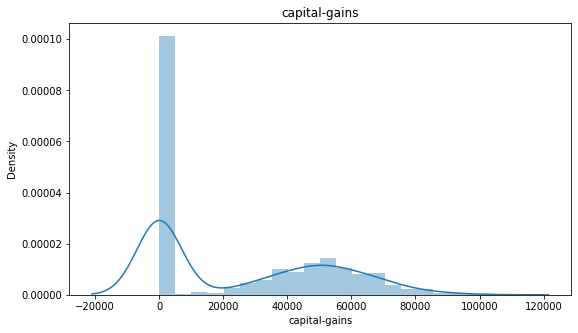

...

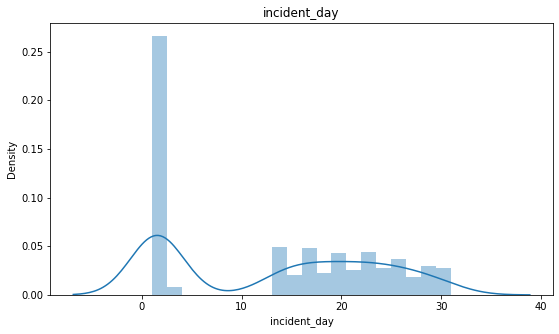

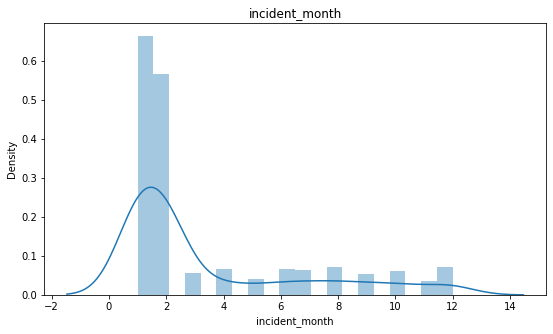

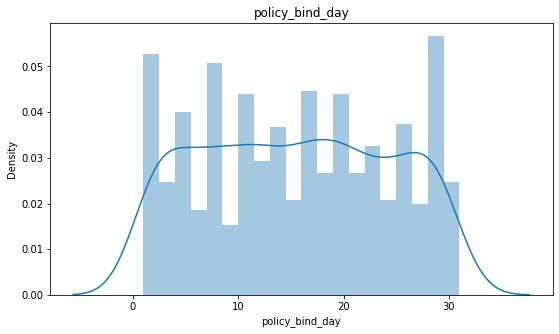

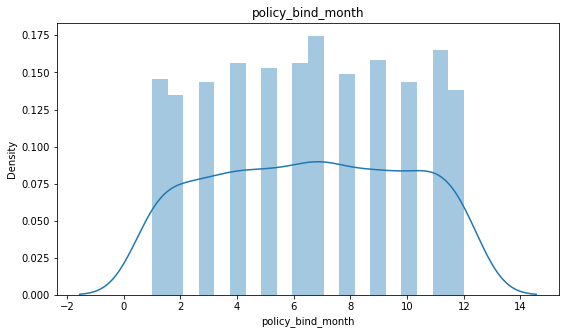

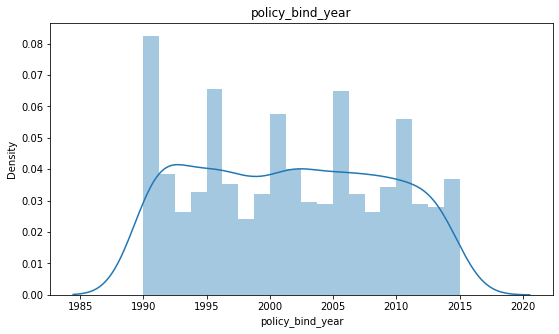

In [37]:
# lets visualize integer data using distplot
for i in df[integer]:
  plt.figure(figsize=(9,5))
  sns.distplot(df[i], bins=20)
  plt.title(i)
  plt.show()

* Here we can see that few columns are skewed towards left. we have to manage our skewness on later stage.
* policy_deductable, capital-gains, capital-loss, number_of_vehicles_involved, bodily_injuries, witnesses, total_claim_amount, injury_claim, property_claim, vehicle_claim, incident_month and incident_day

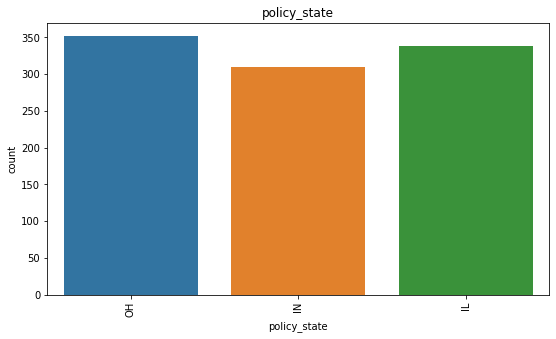

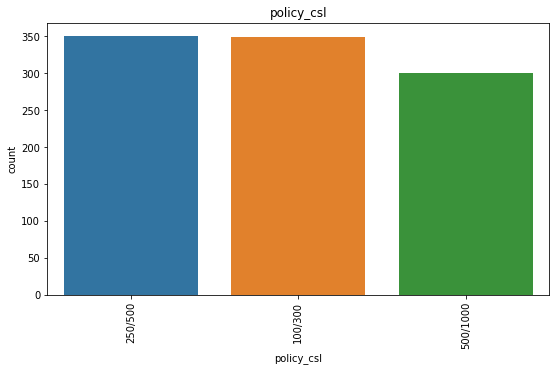

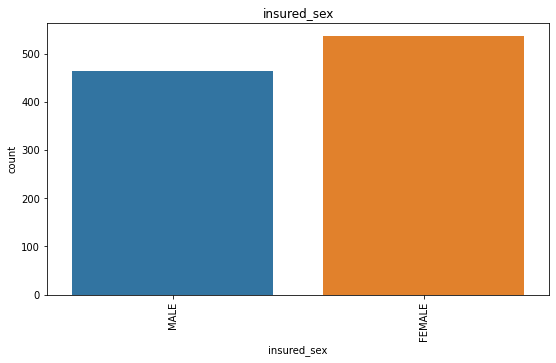

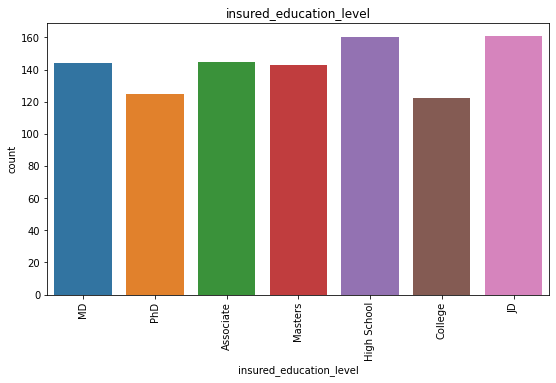

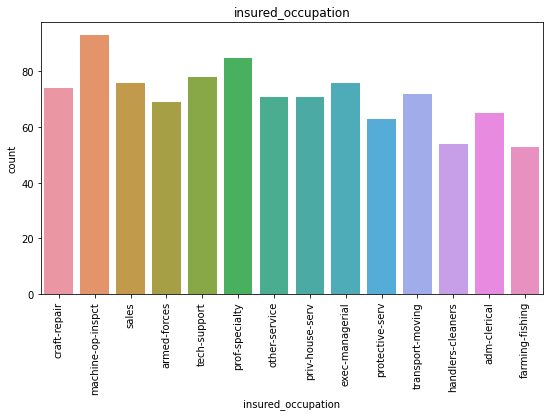

...

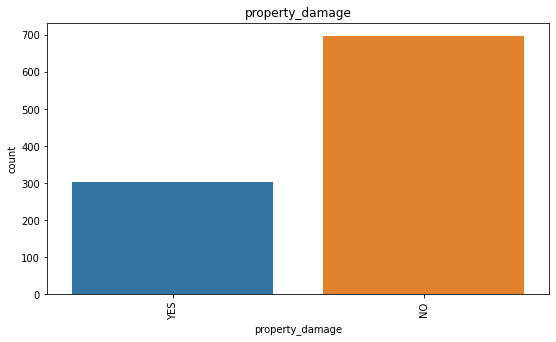

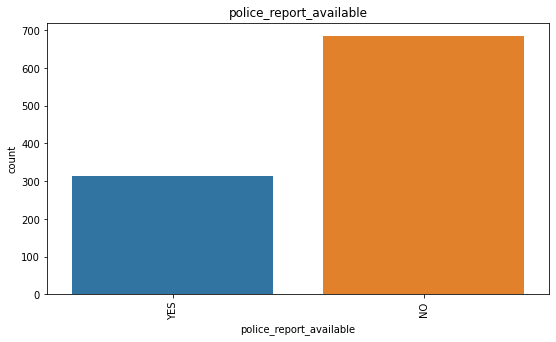

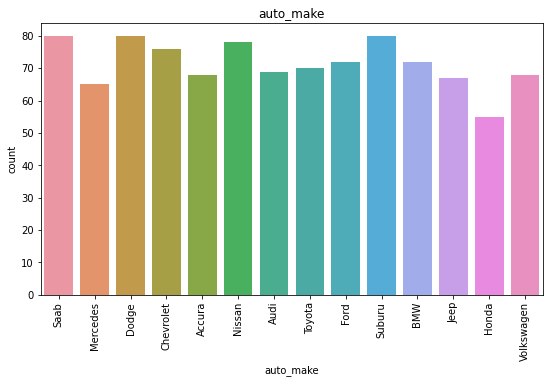

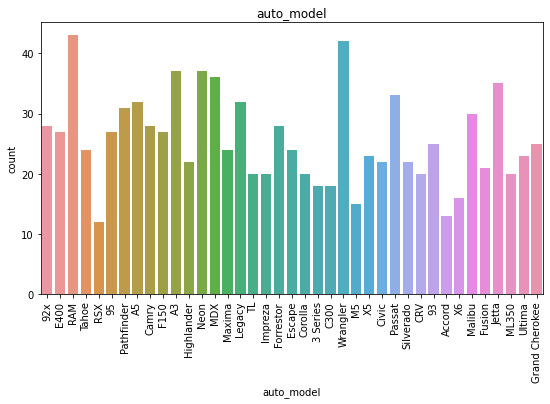

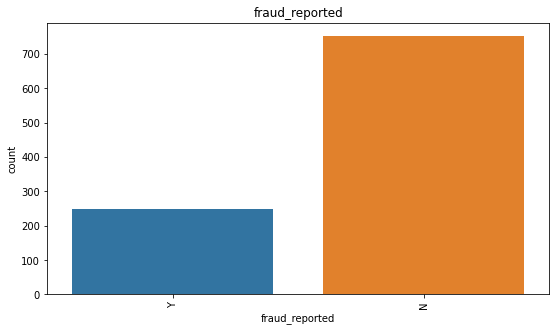

In [40]:
# lets visualize all object columns using barplot
for i in df[object]:
  plt.figure(figsize=(9,5))
  sns.countplot(df[i])
  plt.title(i)
  plt.xticks(rotation=90)
  plt.show()

y looking into the count plots below are my observations.

* in policy_state count is high.
* Female insured are more in number.
.
* Here we can observe that Multi-vehicle-collision and single-vehicle-collision are more in number.
* We can see that Rather than front and side collision Rear Collision has maximum count.
* Here we can clearly see that Minor damage has maximum count compared to Trivial damage.
* here we can see that Police authorities are  contacted the most.
* Here we can see that In NY state most of the cases are registered.
* In all the cities the insuered climb are almost same.
* Here we can also clearly see that our target column is also imbalanced we need to balance it using overfittine method.

# **BiVariate Analysis :**

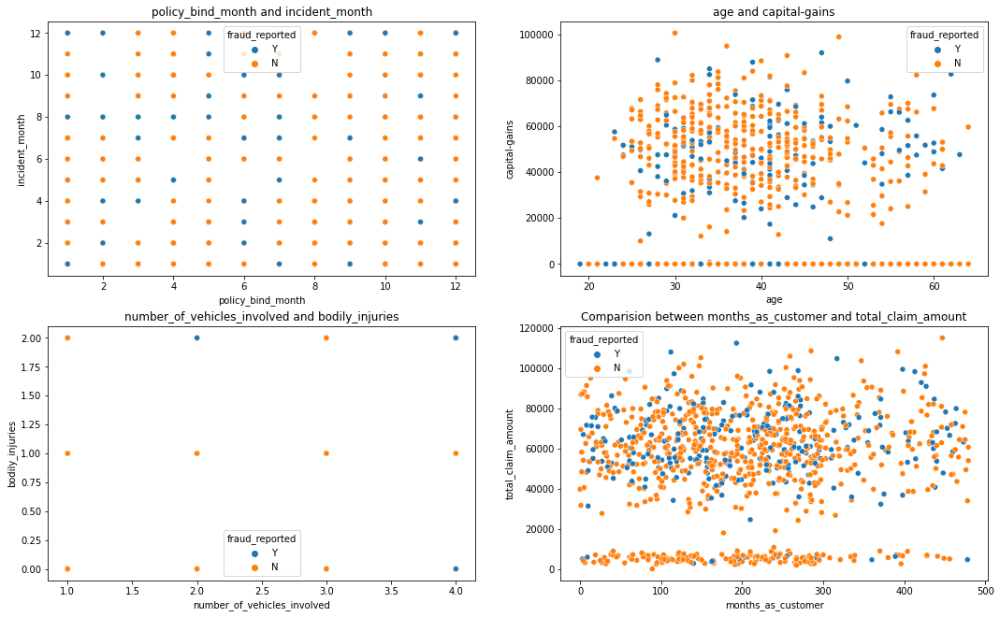

In [43]:
#Lets compare among features with hue as target column using scatter plot
plt.figure(figsize=[18,11])

plt.subplot(2,2,1)
plt.title('policy_bind_month and incident_month')
sns.scatterplot(df['policy_bind_month'],df['incident_month'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('age and capital-gains')
sns.scatterplot(df['age'],df['capital-gains'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(df['number_of_vehicles_involved'],df['bodily_injuries'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported'])

* Here in first plot we can say that chances of reporting fraud is mort  within 1st 7 months
* Here we can see that capital gains are high from age 25 and below 50.
* In third plot we can say that only about 25% frauds are reported.
* In 4th plot we can say that within quite a few people din't claimed the insurance amount.

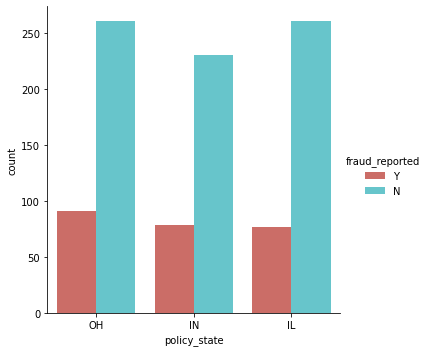

In [44]:
# lets visualize Factor plot for policy_state with hue as fraud_reported
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="hls")
plt.xticks(rotation=0);

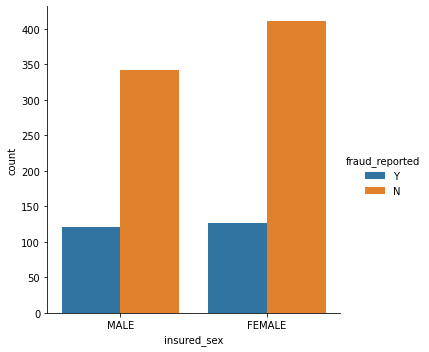

In [45]:
# lets visualize using Factor plot for insured_sex
sns.factorplot('insured_sex',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=0);


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 <a list of 14 Text major ticklabel objects>)

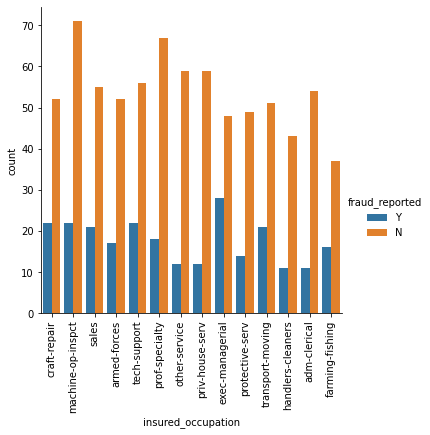

In [50]:
#lets visualize using  barplot for insured_occupation
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported')
plt.xticks(rotation=90)


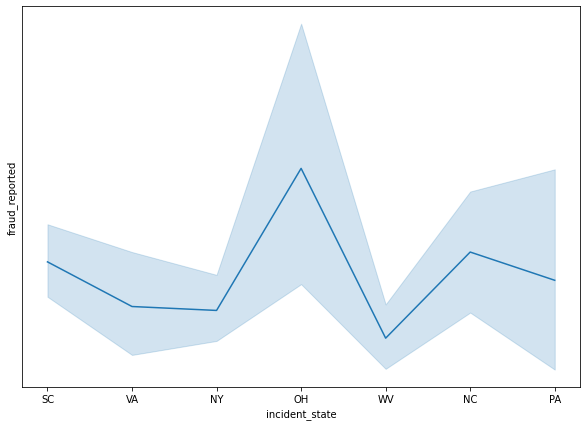

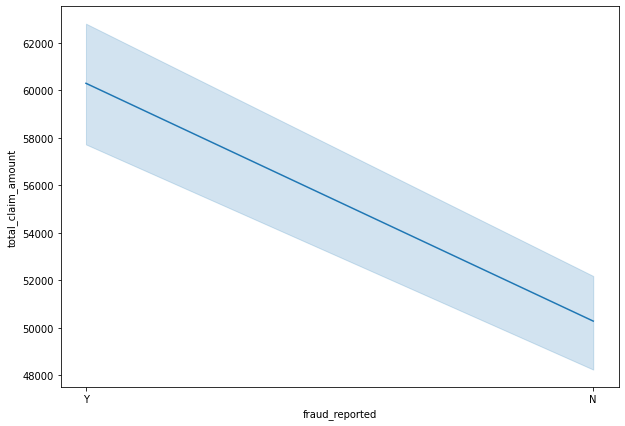

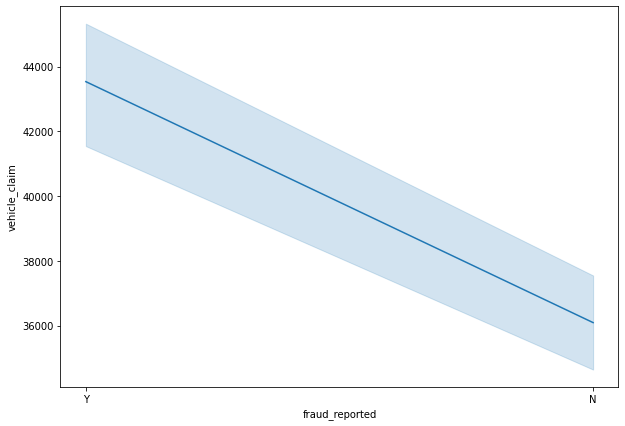

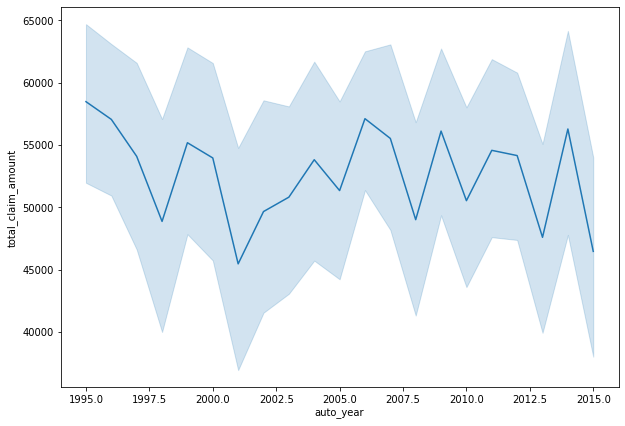

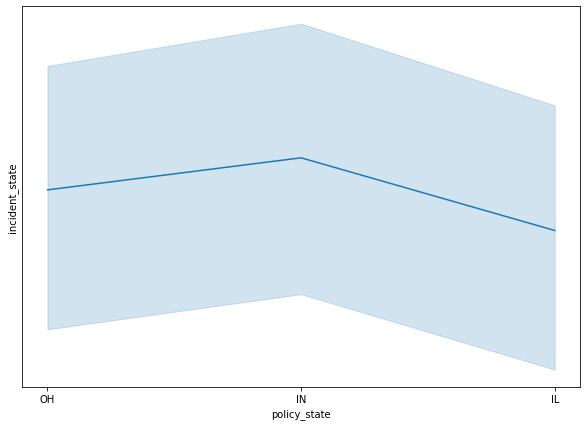

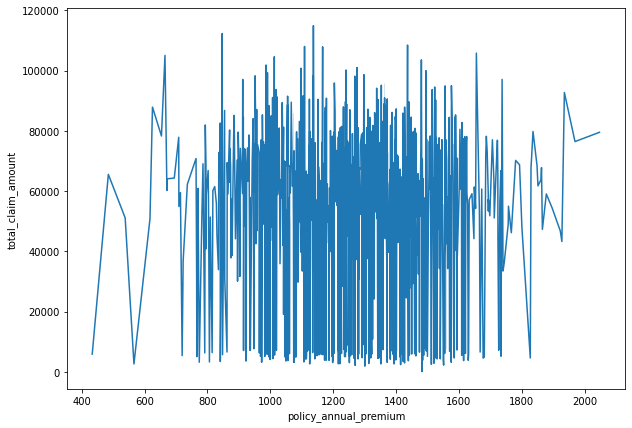

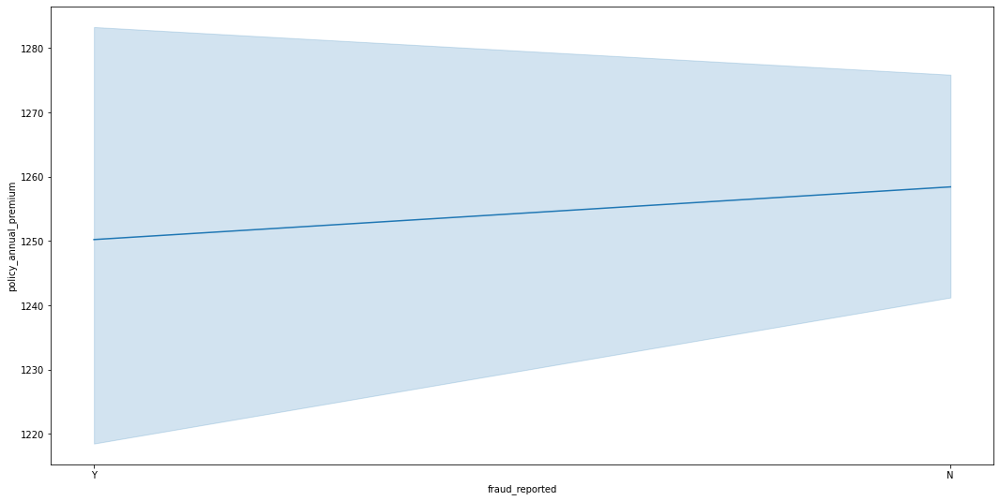

In [51]:
# Lets visualize
plt.figure(figsize=(10,7))
sns.lineplot(y="fraud_reported",x="incident_state",data=df)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="fraud_reported",y="total_claim_amount",data=df)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="fraud_reported",y="vehicle_claim",data=df)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="auto_year",y="total_claim_amount",data=df)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="policy_state",y="incident_state",data=df)
plt.show()

plt.figure(figsize=(10,7))
sns.lineplot(x="policy_annual_premium",y="total_claim_amount",data=df)
plt.show()

plt.figure(figsize=(18,9))
sns.lineplot(x="fraud_reported",y="policy_annual_premium",data=df)
plt.show()


* Here we can see that most frauds were reported from state CH and least were reported from the state Wv.
* here we can see correlation of total_amount claim and fraud_reported
* In next plt we can see correlation of vehicle_claim and fraud_reported.
* correlation betwee total_claim_amount and auto_year, we can say that most of the amount claimed was for automobile manufactured in 2006 and before 1995.
* We can see that most of the people pay annual premium in the range of 800 to 1600 dollor per annum.
* There is no relation between policy annual premium and fraud_reported.

# **MultiVariate Analysis :**

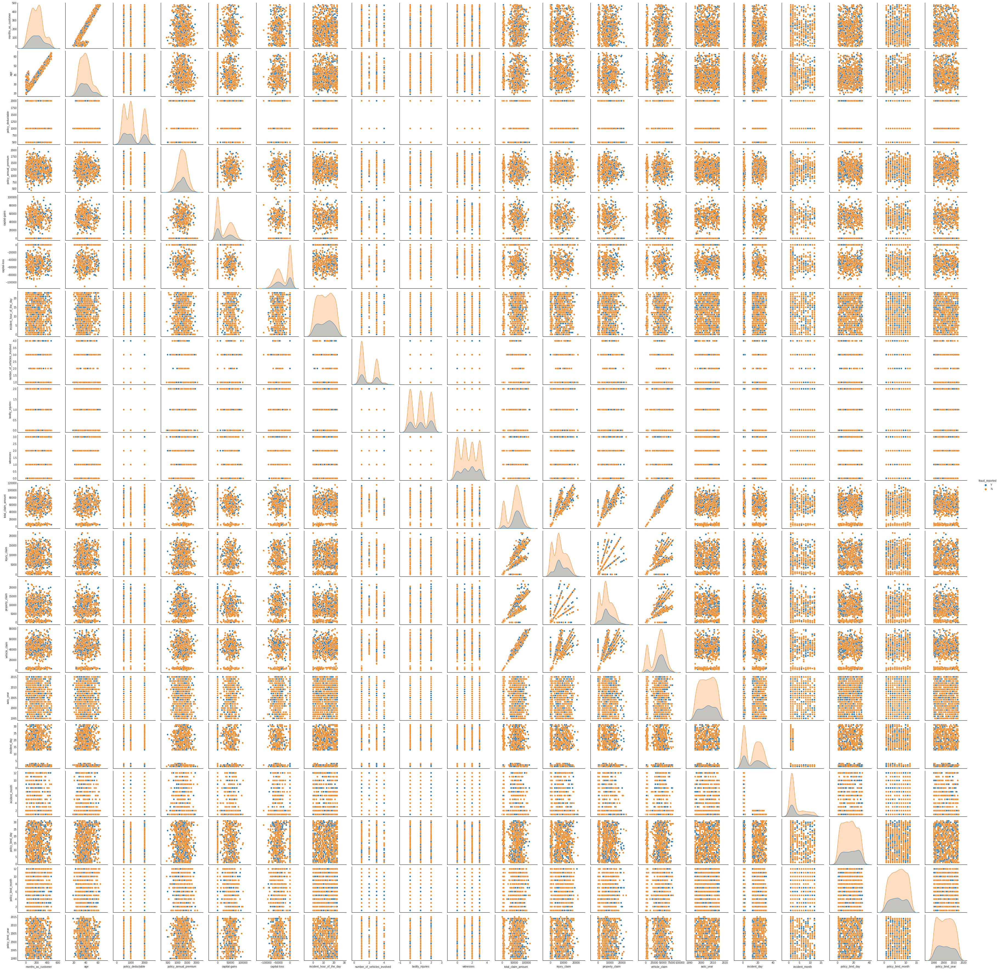

In [55]:
#Lets visualize correlation between columns using pairplot
sns.pairplot(df,hue="fraud_reported")

# **OutLiers :**

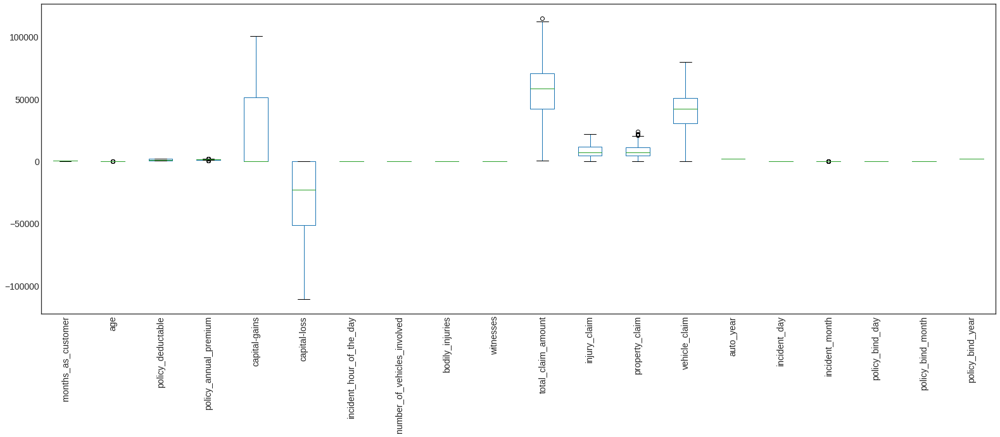

In [56]:
# lets check for the presence of outliers using boxplot
df.plot(rot = 90,kind='box',fontsize=14,figsize=(27,9))

# **ZScore method :**

In [57]:
# lets make a list of columns with outliers.
feat=df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]


In [58]:
# lets import all required libraries
from scipy.stats import zscore
# lets use zscore to remove outliers from the dataset
z=np.abs(zscore(feat))
df1=df[(z<3).all(axis=1)]
df1


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,25,1,17,10,2014
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,21,1,27,6,2006
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,22,2,9,6,2000
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,1,10,25,5,1990
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,17,2,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N,22,2,16,7,1991
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N,24,1,1,5,2014
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,23,1,17,2,2003
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,26,2,18,11,2011


In [59]:
# lets check shape of new dataset
df1.shape

(996, 38)

* Here we can see that our new data have 996 rows in 38 columns, In our old dataframe we had 1000 rows, so we just lost 4 rows to remove outliers from our dataset.

In [61]:
# lets check the dataloss using zscore method
loss=(((df.shape[0]-df1.shape[0])/df.shape[0])*100)
loss

0.4

* Here we can see that the amount of dataloss is just 0.4%.

# **Skewness :**

In [62]:
# lets check presence of skewness in our new dataframe
df1.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
auto_year                     -0.049276
incident_day                   0.055659
incident_month                 1.377097
policy_bind_day                0.028923
policy_bind_month             -0.029722
policy_bind_year               0.058499
dtype: float64

* Skewness allowed limit is +/- 0.50, here skewness is present in 3 columns
total_claim_amount, vehicle_claim, incident_month

In [63]:
# Lets remove skewness using yeo-johnson method
# lets create list of columns which has skewness present
f=["total_claim_amount","vehicle_claim", "incident_month"]

In [64]:
# lets import all required libraries
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')
'''
parameters:
method='box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod='box_cox' or 'yeo-johnson'\n"

In [65]:
df1[f]=scaler.fit_transform(df1[f].values)

In [66]:
# lets check the skewness again
df1[f].skew()

total_claim_amount   -0.508953
vehicle_claim        -0.521354
incident_month        0.305741
dtype: float64

* Here we can see that skewness in all columns have been reduced. its almost like normal now.

# **Encoding:**

In [67]:
# lets separate categorical column in new dataset
object1=[]
for i in df1.dtypes.index:
  if df1.dtypes[i]=='object':
    object1.append(i)
print(object1)

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Here we have separated categorical/object columns from the dataset.

In [68]:
# lets import the required library for encoding
from sklearn.preprocessing import LabelEncoder
# lets encode the categorical column using LabelEncoder
le=LabelEncoder()
df1[object1]=df1[object1].apply(le.fit_transform)
df1[object1].head()

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,1,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,2,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


* Here we see that we have successfully encoded the category columns in our dataset.

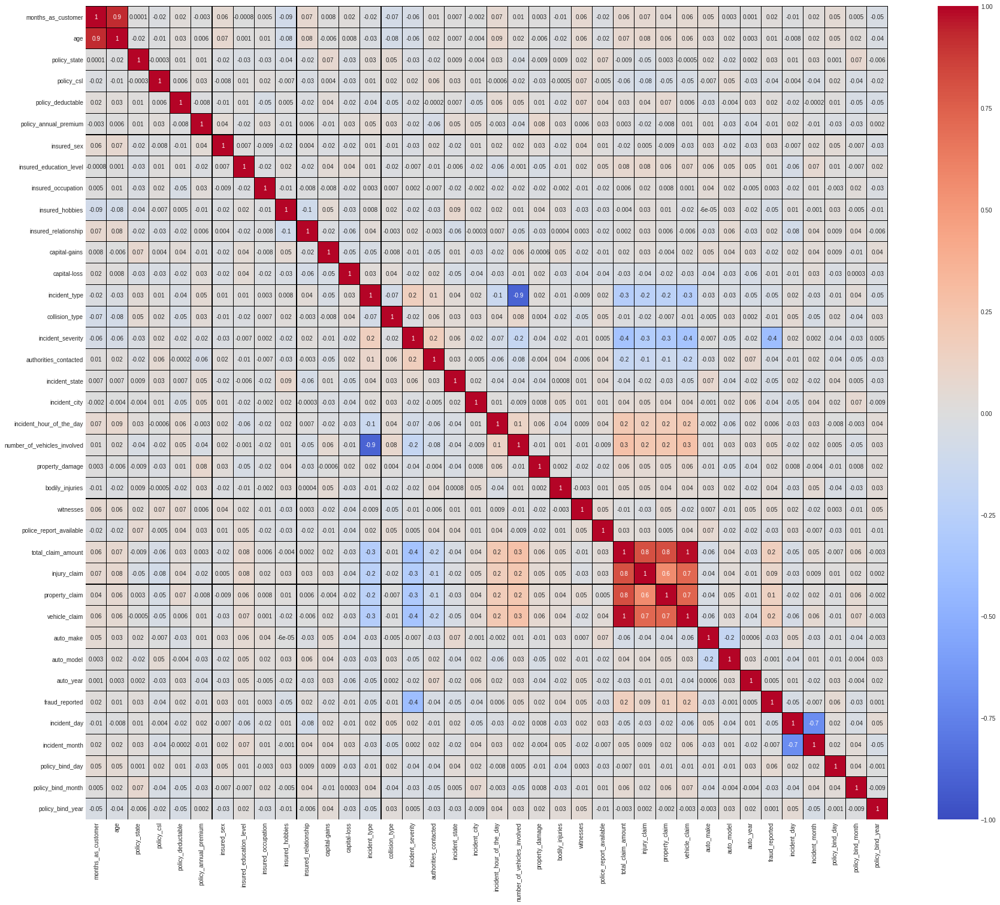

In [69]:
# lets check Correlation using heatmap.
plt.figure(figsize=(30,25))
sns.heatmap(df1.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="coolwarm")
plt.yticks(rotation=0);

* Here we can observe multicolinearity issue between incident type and number_of_vehicles_invovled.
* There is multicolinearity issue between incident_month and incident_day.
* There is multicolinearity issue between total_claim_amount and injury_claim.
* There is multicolinearity issue between total_claim_amount and property_claim.
* There is multicolinearity issue between injury_claim and vehicle_claim.
* There is multicolinearity issue between total_claim_amount and vehicle_claim.
* There is multicolinearity issue between vehicle_claim and property_claim.
* There is multicolinearity issue between total_claim_amount and property_claim.

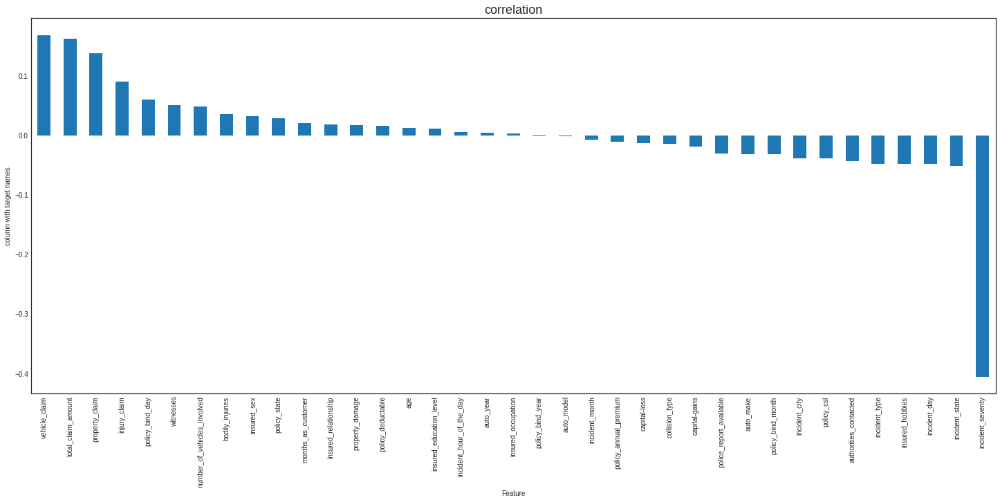

In [71]:
plt.figure(figsize=(25,10))
df1.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar')
plt.xlabel('Feature')
plt.ylabel('column with target names')
plt.title('correlation',fontsize=18)
plt.show()

* Here we can observe that the column policy_bind_year is least correlated with target variable.
* Here we acinsured_occupation and auto_model are less correlated with target column.
* Here we can alaauto_age and incident_hour_of_the_day also less correlated with target

* Lets separate features and target column

In [72]:
# lets assign features to x and target to y
x=df1.drop('fraud_reported', axis=1)
y=df1['fraud_reported']

In [73]:
# now lets Scale the data using Standard Scaler:
# lets import required library for the same
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [75]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,incident_day,incident_month,policy_bind_day,policy_bind_month,policy_bind_year
0,1.074671,0.987190,1.186130,0.063660,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.824928,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-1.644810,-0.182338,1.139807,-1.101370,0.177487,1.013751,1.686176
1,0.204846,0.330455,-0.018137,0.063660,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.824928,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,-0.657437,0.316587,0.756374,-1.101370,1.309223,-0.166145,0.599693
2,-0.612790,-1.092470,1.186130,-1.179582,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.138341,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.958263,0.316587,0.852233,-0.026479,-0.727901,-0.166145,-0.215170
3,0.448397,0.221000,-1.222403,0.063660,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.824928,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.317308,1.480744,-1.160788,1.553647,1.082875,-0.461119,-1.573274
4,0.204846,0.549367,-1.222403,1.306902,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.824928,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,1.048024,0.649203,0.372942,-0.026479,-1.067422,-0.166145,1.686176


* Here you can see that we have successfully scaled the new dataset.

# **Multicolinearity (VIF) :**

In [77]:
# lets import all libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Feat"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feat"]=x.columns
vif

,vif_Feat,Feat
0,6.849914,months_as_customer
1,6.853914,age
2,1.038059,policy_state
3,1.036285,policy_csl
4,1.045468,policy_deductable
5,1.037201,policy_annual_premium
6,1.031779,insured_sex
7,1.047028,insured_education_level
8,1.017436,insured_occupation
9,1.051074,insured_hobbies


* Vif should be below 10, here total_claim_amount, injury_claim, property_claim, vehicle_claim have score far above 10.

In [78]:
# Dropping high Vif columns from the new dataset
x=x.drop(["total_claim_amount"],axis=1)

In [79]:
vif=pd.DataFrame()
vif["vif_Feat"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["Feat"]=x.columns
vif


,vif_Feat,Feat
0,6.848162,months_as_customer
1,6.853796,age
2,1.038032,policy_state
3,1.035288,policy_csl
4,1.043956,policy_deductable
5,1.036484,policy_annual_premium
6,1.028886,insured_sex
7,1.046976,insured_education_level
8,1.016725,insured_occupation
9,1.049212,insured_hobbies


* Now the multicolinearity issue is solved. All the VIF values are below 10 now.

# **Oversampling :**

In [80]:
# lets check the value count of target column
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

* Here we can see that the data is imbalanced here.

In [81]:
# Lets import all required libraries
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y =sm.fit_resample(x,y)

In [82]:
# lets check the value_counts once again
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

* Here we have successfully balanced the dataset using oversampling method SMOTE.

# **Best Random State:**

In [83]:
# lets find the best random state and accuracy
# importing all required libraries
from sklearn.metrics import accuracy_score, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier

In [84]:
# lets find best random state and accuracy score
max_acc=0
max_rs=0
for i in range(1,250):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.27,random_state=i )
    mod=RandomForestClassifier()
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>max_acc:
        max_acc=acc
        max_rs=i
print("Best accuracy is ",max_acc,"on random_state ",max_rs)

Best accuracy is  0.9333333333333333 on random_state  58


* Here we have got prediction of    93.33% accuracy at random state 58

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.27,random_state=58)

# **Classification Problem :**
            Using Classification Algorithms

In [85]:
# lets import all required libraries for model selection
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.naive_bayes import GaussianNB as NB

# **1) KNeighbors Classifier (KNN) :**

In [86]:
knn=KNN()
knn.fit(x_train,y_train)
pred_k=knn.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,pred_k))
print("Confusion Matrix: ",confusion_matrix(y_test,pred_k))
print(classification_report(y_test,pred_k))

Accuracy Score:  0.6814814814814815
Confusion Matrix:  [[ 64 119]
 [ 10 212]]
              precision    recall  f1-score   support

           0       0.86      0.35      0.50       183
           1       0.64      0.95      0.77       222

    accuracy                           0.68       405
   macro avg       0.75      0.65      0.63       405
weighted avg       0.74      0.68      0.65       405



* Here we have got score of just 68.14 %

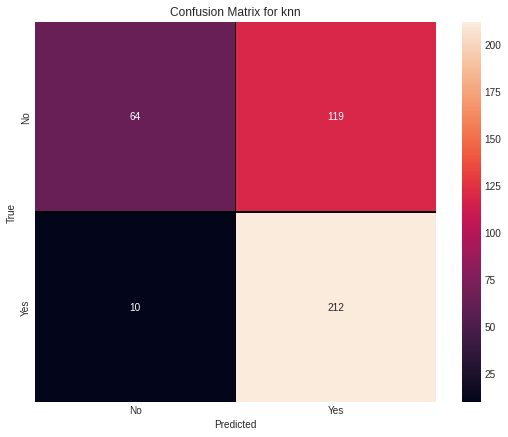

In [87]:
cm=confusion_matrix(y_test,pred_k)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(cm, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for knn')
plt.show()

# **2) ExtraTreesClassifier:**

In [88]:
etc=ExtraTreesClassifier()
etc.fit(x_train,y_train)
pred_e=etc.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,pred_e))
print("Confusion Matrix: ",confusion_matrix(y_test,pred_e))
print(classification_report(y_test,pred_e))

Accuracy Score:  0.8864197530864197
Confusion Matrix:  [[161  22]
 [ 24 198]]
              precision    recall  f1-score   support

           0       0.87      0.88      0.88       183
           1       0.90      0.89      0.90       222

    accuracy                           0.89       405
   macro avg       0.89      0.89      0.89       405
weighted avg       0.89      0.89      0.89       405



* Here we have got score of 88.64% using ExtraTreesClassifier

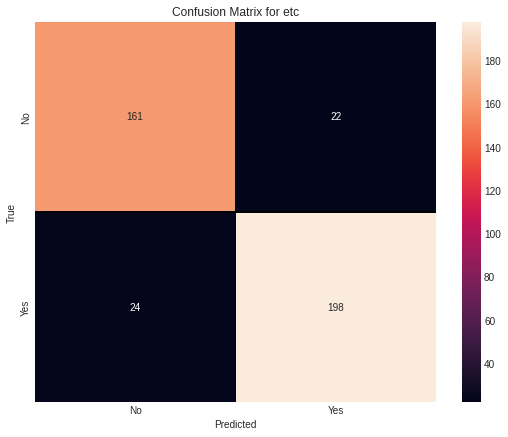

In [89]:
cm=confusion_matrix(y_test,pred_e)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(cm, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for etc')
plt.show()

# **3) Gradient Boosting Classifier:**

In [90]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)
pred_g=gbc.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,pred_g))
print("Confusion Matrix: ",confusion_matrix(y_test,pred_g))
print(classification_report(y_test,pred_e))

Accuracy Score:  0.8666666666666667
Confusion Matrix:  [[158  25]
 [ 29 193]]
              precision    recall  f1-score   support

           0       0.87      0.88      0.88       183
           1       0.90      0.89      0.90       222

    accuracy                           0.89       405
   macro avg       0.89      0.89      0.89       405
weighted avg       0.89      0.89      0.89       405



* here we have got score of 86.66% using GradientBoostingClassifier.

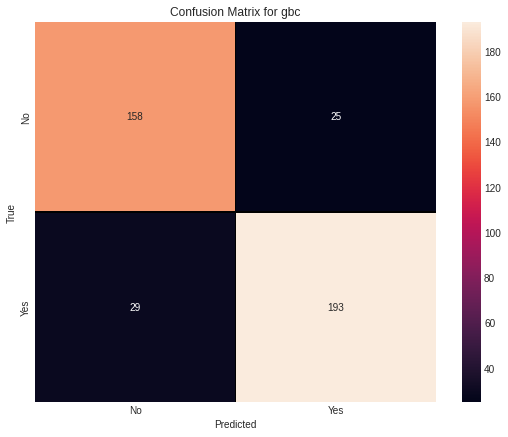

In [91]:
cm=confusion_matrix(y_test,pred_g)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(cm, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for gbc')
plt.show()

# **4) Decision Tree Classifier:**

In [92]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_d=dtc.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,pred_d))
print("Confusion Matrix: ",confusion_matrix(y_test,pred_d))
print(classification_report(y_test,pred_d))

Accuracy Score:  0.8148148148148148
Confusion Matrix:  [[144  39]
 [ 36 186]]
              precision    recall  f1-score   support

           0       0.80      0.79      0.79       183
           1       0.83      0.84      0.83       222

    accuracy                           0.81       405
   macro avg       0.81      0.81      0.81       405
weighted avg       0.81      0.81      0.81       405



* Here we have got score of 81.48% using Decision Tree Classifier

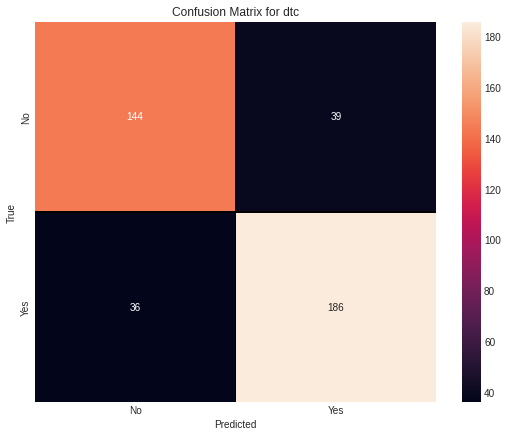

In [93]:
cm=confusion_matrix(y_test,pred_d)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(cm, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for dtc')
plt.show()

# **5) Random Forest Classifier:**

In [94]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
pred_r=rfc.predict(x_test)
print("Accuracy Score: ", accuracy_score(y_test,pred_r))
print("Confusion Matrix: ",confusion_matrix(y_test,pred_r))
print(classification_report(y_test,pred_r))

Accuracy Score:  0.8716049382716049
Confusion Matrix:  [[162  21]
 [ 31 191]]
              precision    recall  f1-score   support

           0       0.84      0.89      0.86       183
           1       0.90      0.86      0.88       222

    accuracy                           0.87       405
   macro avg       0.87      0.87      0.87       405
weighted avg       0.87      0.87      0.87       405



* here we have got score of 87.16 using Random Forest Classifier.

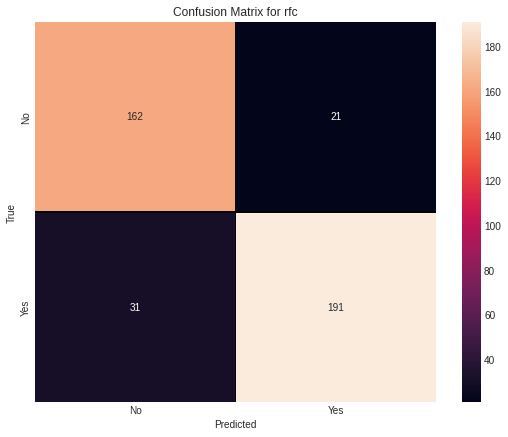

In [95]:
cm=confusion_matrix(y_test,pred_r)
x_axis_labels= ["No","Yes"]
y_axis_labels= ["No","Yes"]
f,ax = plt.subplots(figsize=(9,7))
sns.heatmap(cm, annot=True, linewidth=.2, linecolor="black",fmt='.0f',ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for rfc')
plt.show()

# **Cross Validation Scores:**

In [96]:
# Lets import required library
from sklearn.model_selection import cross_val_score

In [97]:
# cv score for KNN
print(cross_val_score(knn,x,y,cv=5).mean())

0.662


In [98]:
# cv score for etc
print(cross_val_score(etc,x,y,cv=5).mean())

0.9100000000000001


In [99]:
# cv score for gbc
print(cross_val_score(gbc,x,y,cv=5).mean())

0.8726666666666667


In [100]:
# cv score for dtc
print(cross_val_score(dtc,x,y,cv=5).mean())

0.8306666666666667


In [101]:
# cv score for rfc
print(cross_val_score(rfc,x,y,cv=5).mean())

0.8720000000000001


Here the Cross Validation scores of all the models

Least difference between model accuracy and cross_val_score. Here ExtraTreesClassifier cross validation score came almost 3% higher than the accuracy score. so i found etc as my best model.

# **Hyper Parameter Tuning:**

In [102]:
# lets import required library
from sklearn.model_selection import GridSearchCV

In [103]:
parameter= {'criterion':['gini','entropy'],
             'random_state': [10,100,1000],
             'n_jobs':[-2,-1,1,2],
             'n_estimators':[100,200,300],
             'max_depth': [0,10,20]}

In [104]:
gcv=GridSearchCV(ExtraTreesClassifier(),parameter,cv=5)

In [105]:
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [100, 200, 300],
                         'n_jobs': [-2, -1, 1, 2],
                         'random_state': [10, 100, 1000]})

In [106]:
gcv.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 100,
 'n_jobs': -2,
 'random_state': 1000}

In [107]:
model=ExtraTreesClassifier(criterion='gini', max_depth=20 ,n_estimators=100 , n_jobs=-2 , random_state=1000 )
model.fit(x_train,y_train)
pred=model.predict(x_test)
acc=accuracy_score(y_test, pred)

print('Accuracy Score:',(accuracy_score(y_test,pred)*100))
print('Confusion matrix:',confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy Score: 90.37037037037037
Confusion matrix: [[165  18]
 [ 21 201]]
              precision    recall  f1-score   support

           0       0.89      0.90      0.89       183
           1       0.92      0.91      0.91       222

    accuracy                           0.90       405
   macro avg       0.90      0.90      0.90       405
weighted avg       0.90      0.90      0.90       405



* After Hyper Parameter Tuning we can see score is improved by almost 2 % as compared to the Accuracy_Score.

# **ROC-AUC-curve:**

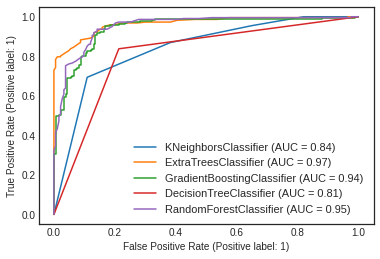

In [108]:
# lets import all required libraries
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 
disp = plot_roc_curve(knn,x_test,y_test)
# ax_=Axes with confusion matrix
plot_roc_curve(etc, x_test, y_test, ax=disp.ax_)     
plot_roc_curve(gbc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(dtc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rfc, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

* Here are the ROC curves for all the models that i have predicted and the AUC values can also be seen in the plot itself.

# **Saving The Model :**

In [109]:
#Saving the model as .pkl file
import joblib
joblib.dump(model,"InsuranceClaim_FraudDetection.pkl")

['InsuranceClaim_FraudDetection.pkl']

# **Loading and predicting:**

In [110]:
# Loading the saved model
model=joblib.load("InsuranceClaim_FraudDetection.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,

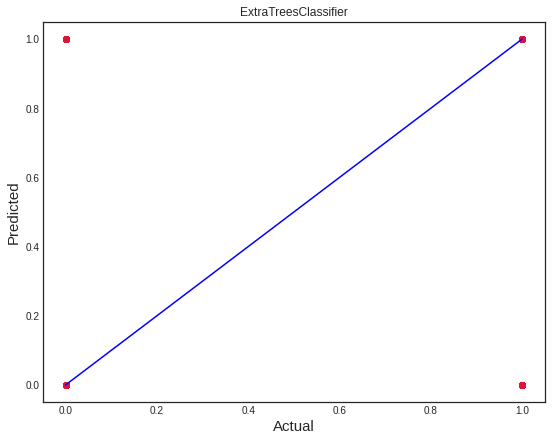

In [111]:
plt.figure(figsize=(9,7))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("ExtraTreesClassifier")
plt.show()


# **Project Complete**

# **Thank You So Much**